## Data Set Information:
* The dataset includes 244 instances that regroup a data of two regions of Algeria,namely the Bejaia region located in the northeast of Algeria and the Sidi Bel-abbes region located in the northwest of Algeria.
* 122 instances for each region.
* The period from June 2012 to September 2012.
* The dataset includes 11 attribues and 1 output attribue (class)

#### Attribute Information:

1. Date : (DD/MM/YYYY) Day, month ('june' to 'september'), year (2012)
###### Weather data observations
2. Temp : temperature noon (temperature max) in Celsius degrees: 22 to 42
3. RH : Relative Humidity in %: 21 to 90
4. Ws :Wind speed in km/h: 6 to 29
5. Rain: total day in mm: 0 to 16.8
##### FWI Components
6. Fine Fuel Moisture Code (FFMC) index from the FWI system: 28.6 to 92.5
7. Duff Moisture Code (DMC) index from the FWI system: 1.1 to 65.9
8. Drought Code (DC) index from the FWI system: 7 to 220.4
9. Initial Spread Index (ISI) index from the FWI system: 0 to 18.5
10. Buildup Index (BUI) index from the FWI system: 1.1 to 68
11. Fire Weather Index (FWI) Index: 0 to 31.1
12. Classes: two classes, namely Fire  and not Fire

#### Problem Statement): To predict the class weather will Fire or Not Fire based on regions 

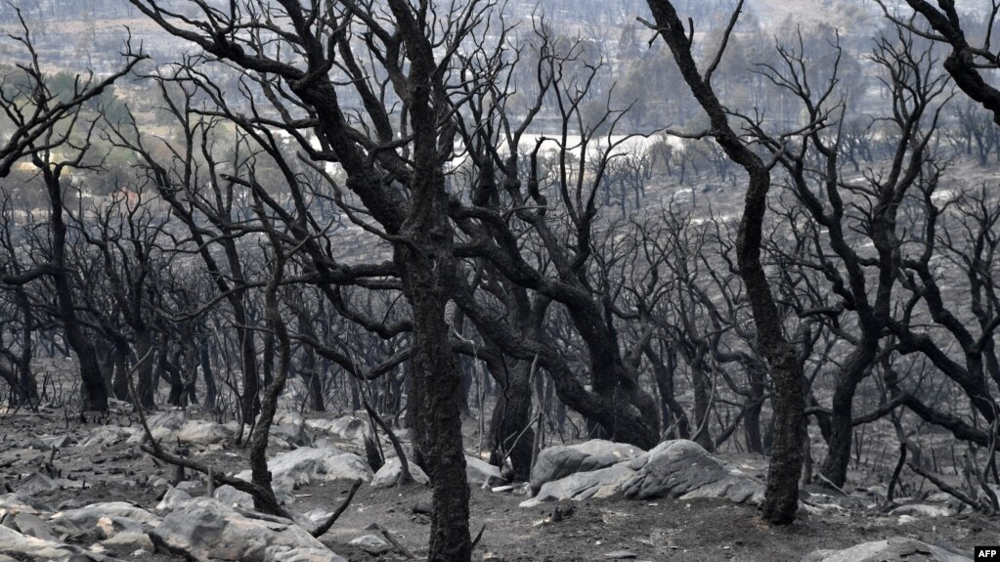

# Import required libraries

In [1]:
#Import basic modules.
import numpy as np               # For linear algebra
import pandas as pd              # For data manipulation
import matplotlib.pyplot as plt  # For 2D visualization
import seaborn as sns            
from scipy import stats          # For statistics

# Plotly visualization.
import plotly.graph_objs as go
from plotly.tools import make_subplots
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected = True) # Required to use plotly offline in jupyter notebook

# Machine learning models.
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier

# Classification (evaluation) metrices.
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score

import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split

In [2]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [3]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
%matplotlib inline

In [ ]:
from sklearn.preprocessing import PowerTransformer

## Load Dataset

In [4]:
df=pd.read_csv(r"Algerian_forest_fires_dataset_UPDATE.csv")

In [34]:
df

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire,0.0
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire,0.0
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire,0.0
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire,0.0
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,26,09,2012,30,65,14,0,85.4,16,44.5,4.5,16.9,6.5,fire,1.0
240,27,09,2012,28,87,15,4.4,41.1,6.5,8,0.1,6.2,0,not fire,1.0
241,28,09,2012,27,87,29,0.5,45.9,3.5,7.9,0.4,3.4,0.2,not fire,1.0
242,29,09,2012,24,54,18,0.1,79.7,4.3,15.2,1.7,5.1,0.7,not fire,1.0


## Modifying the data region wise for further process

In [6]:
df=pd.read_csv(r"Algerian_forest_fires_dataset_UPDATE.csv",header=1)

In [7]:
df.head()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire


In [8]:
df.iloc[1:5,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire


In [9]:
df.iloc[121:125,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire
122,Sidi-Bel Abbes Region Dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
124,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire


### Dropping row no 122 specifying region name & 123 repeating the same header

In [10]:
df.drop([122,123],inplace=True)

In [12]:
df.iloc[121:125,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire
124,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire
125,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire
126,03,06,2012,29,80,14,2,48.7,2.2,7.6,0.3,2.6,0.1,not fire


### Resetting the index and dropping the index column

In [13]:
df.reset_index(inplace=True)

In [14]:
df.iloc[121:125,:]

,index,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
121,121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire
122,124,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire
123,125,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire
124,126,03,06,2012,29,80,14,2,48.7,2.2,7.6,0.3,2.6,0.1,not fire


In [15]:
df.drop('index',axis=1,inplace=True)

In [17]:
df.iloc[121:126,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire
122,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire
123,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire
124,03,06,2012,29,80,14,2,48.7,2.2,7.6,0.3,2.6,0.1,not fire
125,04,06,2012,30,64,14,0,79.4,5.2,15.4,2.2,5.6,1,not fire


In [19]:
df.iloc[1:123,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire
5,06,06,2012,31,67,14,0,82.6,5.8,22.2,3.1,7,2.5,fire
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,27,09,2012,31,66,11,0,85.7,8.3,24.9,4,9,4.1,fire
119,28,09,2012,32,47,14,0.7,77.5,7.1,8.8,1.8,6.8,0.9,not fire
120,29,09,2012,26,80,16,1.8,47.4,2.9,7.7,0.3,3,0.1,not fire
121,30,09,2012,25,78,14,1.4,45,1.9,7.5,0.2,2.4,0.1,not fire


In [100]:
df.loc[122:125,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
122,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire
123,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire
124,03,06,2012,29,80,14,2,48.7,2.2,7.6,0.3,2.6,0.1,not fire
125,04,06,2012,30,64,14,0,79.4,5.2,15.4,2.2,5.6,1,not fire


##### From above data information we can see that 
* Record from 1 to 121 are from Bejaia region
* Record 122 onwards are from  Sidi Bel-abbes region
###### So we are going to encode 0 as  Bejaia and 1 as Sidi Bel-abbes by creating new column as Region

### Creating a new column called Region reprenting { 0: Bejaia and 1- Sidi Bel-abbes }

In [20]:
df.loc[:121,"Region"]=0
df.loc[122:,"Region"]=1

In [21]:
df.loc[1:121,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire,0.0
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire,0.0
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire,0.0
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire,0.0
5,06,06,2012,31,67,14,0,82.6,5.8,22.2,3.1,7,2.5,fire,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,26,09,2012,31,54,11,0,82,6,16.3,2.5,6.2,1.7,not fire,0.0
118,27,09,2012,31,66,11,0,85.7,8.3,24.9,4,9,4.1,fire,0.0
119,28,09,2012,32,47,14,0.7,77.5,7.1,8.8,1.8,6.8,0.9,not fire,0.0
120,29,09,2012,26,80,16,1.8,47.4,2.9,7.7,0.3,3,0.1,not fire,0.0


In [103]:
df.loc[122:125,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
122,01,06,2012,32,71,12,0.7,57.1,2.5,8.2,0.6,2.8,0.2,not fire,1.0
123,02,06,2012,30,73,13,4,55.7,2.7,7.8,0.6,2.9,0.2,not fire,1.0
124,03,06,2012,29,80,14,2,48.7,2.2,7.6,0.3,2.6,0.1,not fire,1.0
125,04,06,2012,30,64,14,0,79.4,5.2,15.4,2.2,5.6,1,not fire,1.0


# Feature Engineering

## EDA 

In [23]:
df.shape

(244, 15)

* Total record are 244
* Total features 15

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          244 non-null    object 
 1   month        244 non-null    object 
 2   year         244 non-null    object 
 3   Temperature  244 non-null    object 
 4    RH          244 non-null    object 
 5    Ws          244 non-null    object 
 6   Rain         244 non-null    object 
 7   FFMC         244 non-null    object 
 8   DMC          244 non-null    object 
 9   DC           244 non-null    object 
 10  ISI          244 non-null    object 
 11  BUI          244 non-null    object 
 12  FWI          244 non-null    object 
 13  Classes      243 non-null    object 
 14  Region       244 non-null    float64
dtypes: float64(1), object(14)
memory usage: 28.7+ KB


In [107]:
df.isnull().sum()

day            0
month          0
year           0
Temperature    0
 RH            0
 Ws            0
Rain           0
FFMC           0
DMC            0
DC             0
ISI            0
BUI            0
FWI            0
Classes        1
Region         0
dtype: int64

* We can see that there is one missing value in classes column and the datatype of features are not in proper way for model bulding

In [26]:
df.columns

Index(['day', 'month', 'year', 'Temperature', ' RH', ' Ws', 'Rain ', 'FFMC',
       'DMC', 'DC', 'ISI', 'BUI', 'FWI', 'Classes  ', 'Region'],
      dtype='object')

* We ca see that header names have spaces so that required to be clean properly

## Data Cleaning

In [31]:
# Removing unnecessary space in column headers using str.strip()

In [32]:
df.columns=df.columns.str.strip()
df.columns

Index(['day', 'month', 'year', 'Temperature', 'RH', 'Ws', 'Rain', 'FFMC',
       'DMC', 'DC', 'ISI', 'BUI', 'FWI', 'Classes', 'Region'],
      dtype='object')

In [35]:
df.isnull().sum()

day            0
month          0
year           0
Temperature    0
RH             0
Ws             0
Rain           0
FFMC           0
DMC            0
DC             0
ISI            0
BUI            0
FWI            0
Classes        1
Region         0
dtype: int64

In classes feature we have only one record having null value so we can drop it

In [36]:
# Fetching record having Nan value in classes feature
Nan_rows = df[df['Classes'].isnull()]

In [37]:
Nan_rows

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
165,14,07,2012,37,37,18,0.2,88.9,12.9,14.6 9,12.5,10.4,fire,NaN,1.0


In [39]:
df.loc[164:167,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
164,13,07,2012,39,45,13,0.6,85.2,11.3,10.4,4.2,10.9,4.7,fire,1.0
165,14,07,2012,37,37,18,0.2,88.9,12.9,14.6 9,12.5,10.4,fire,NaN,1.0
166,15,07,2012,34,45,17,0,90.5,18,24.1,10.9,17.7,14.1,fire,1.0
167,16,07,2012,31,83,17,0,84.5,19.4,33.1,4.7,19.2,7.3,fire,1.0


In [40]:
# dropping the rows having NaN values
df = df.dropna()

In [41]:
df.loc[164:167,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
164,13,07,2012,39,45,13,0.6,85.2,11.3,10.4,4.2,10.9,4.7,fire,1.0
166,15,07,2012,34,45,17,0,90.5,18,24.1,10.9,17.7,14.1,fire,1.0
167,16,07,2012,31,83,17,0,84.5,19.4,33.1,4.7,19.2,7.3,fire,1.0


In [ ]:
# To reset the indices
df = df.reset_index(drop = True)

If you set drop = True , reset_index will delete the index instead of inserting it back into the columns of the DataFrame. If you set drop = True , the current index will be deleted entirely and the numeric index will replace it.

In [42]:
# To reset the indices
df = df.reset_index(drop = True)

In [43]:
df.loc[164:167,:]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
164,13,07,2012,39,45,13,0.6,85.2,11.3,10.4,4.2,10.9,4.7,fire,1.0
165,15,07,2012,34,45,17,0,90.5,18,24.1,10.9,17.7,14.1,fire,1.0
166,16,07,2012,31,83,17,0,84.5,19.4,33.1,4.7,19.2,7.3,fire,1.0
167,17,07,2012,32,81,17,0,84.6,21.1,42.3,4.7,20.9,7.7,fire,1.0


In [45]:
df.isnull().sum()

day            0
month          0
year           0
Temperature    0
RH             0
Ws             0
Rain           0
FFMC           0
DMC            0
DC             0
ISI            0
BUI            0
FWI            0
Classes        0
Region         0
dtype: int64

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243 entries, 0 to 242
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          243 non-null    object 
 1   month        243 non-null    object 
 2   year         243 non-null    object 
 3   Temperature  243 non-null    object 
 4   RH           243 non-null    object 
 5   Ws           243 non-null    object 
 6   Rain         243 non-null    object 
 7   FFMC         243 non-null    object 
 8   DMC          243 non-null    object 
 9   DC           243 non-null    object 
 10  ISI          243 non-null    object 
 11  BUI          243 non-null    object 
 12  FWI          243 non-null    object 
 13  Classes      243 non-null    object 
 14  Region       243 non-null    float64
dtypes: float64(1), object(14)
memory usage: 28.6+ KB


Converting the necessary column into required data type

In [47]:
df[['day', 'month', 'year', 'Temperature', 'RH', 'Ws',"Region"]]=df[['day', 'month', 'year', 'Temperature', 'RH', 'Ws',"Region"]].astype(int)

In [48]:
df[['Rain', 'FFMC','DMC', 'DC', 'ISI', 'BUI', 'FWI']]=df[['Rain', 'FFMC','DMC', 'DC', 'ISI', 'BUI', 'FWI']].astype('float')

In [50]:
df.Classes.unique()

array(['not fire   ', 'fire   ', 'fire', 'fire ', 'not fire', 'not fire ',
       'not fire     ', 'not fire    '], dtype=object)

In [51]:
df.Classes=df.Classes.str.strip()
df.Classes.unique()

array(['not fire', 'fire'], dtype=object)

In [57]:
df.Classes.value_counts()

fire        137
not fire    106
Name: Classes, dtype: int64

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243 entries, 0 to 242
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          243 non-null    int32  
 1   month        243 non-null    int32  
 2   year         243 non-null    int32  
 3   Temperature  243 non-null    int32  
 4   RH           243 non-null    int32  
 5   Ws           243 non-null    int32  
 6   Rain         243 non-null    float64
 7   FFMC         243 non-null    float64
 8   DMC          243 non-null    float64
 9   DC           243 non-null    float64
 10  ISI          243 non-null    float64
 11  BUI          243 non-null    float64
 12  FWI          243 non-null    float64
 13  Classes      243 non-null    object 
 14  Region       243 non-null    int32  
dtypes: float64(7), int32(7), object(1)
memory usage: 22.0+ KB


In [54]:
df.year.value_counts()

2012    243
Name: year, dtype: int64

Dropping the year column as the data is for the same year

In [55]:
df=df.drop(['year'],axis=1)

In [56]:
df.columns

Index(['day', 'month', 'Temperature', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC',
       'ISI', 'BUI', 'FWI', 'Classes', 'Region'],
      dtype='object')

In [58]:
df.to_csv('Algerian_forest_fires_dataset_cleaned_data.csv', index=False)

In [59]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
day,243.0,15.761317,8.842552,1.0,8.00,16.0,23.00,31.0
month,243.0,7.502058,1.114793,6.0,7.00,8.0,8.00,9.0
Temperature,243.0,32.152263,3.628039,22.0,30.00,32.0,35.00,42.0
RH,243.0,62.041152,14.828160,21.0,52.50,63.0,73.50,90.0
Ws,243.0,15.493827,2.811385,6.0,14.00,15.0,17.00,29.0
Rain,243.0,0.762963,2.003207,0.0,0.00,0.0,0.50,16.8
FFMC,243.0,77.842387,14.349641,28.6,71.85,83.3,88.30,96.0
DMC,243.0,14.680658,12.393040,0.7,5.80,11.3,20.80,65.9
DC,243.0,49.430864,47.665606,6.9,12.35,33.1,69.10,220.4
ISI,243.0,4.742387,4.154234,0.0,1.40,3.5,7.25,19.0


In [73]:
df

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
0,1,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,not fire,0
1,2,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,not fire,0
2,3,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire,0
3,4,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,not fire,0
4,5,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,not fire,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,26,9,30,65,14,0.0,85.4,16.0,44.5,4.5,16.9,6.5,fire,1
239,27,9,28,87,15,4.4,41.1,6.5,8.0,0.1,6.2,0.0,not fire,1
240,28,9,27,87,29,0.5,45.9,3.5,7.9,0.4,3.4,0.2,not fire,1
241,29,9,24,54,18,0.1,79.7,4.3,15.2,1.7,5.1,0.7,not fire,1


## Analysis using Data Visuallization

In [ ]:
## Categorical Variable Analysis

In [61]:
# All possible categoric features
cat_features = [column for column in df.columns if df[column].dtype in ["object"]]

In [62]:
cat_features

['Classes']

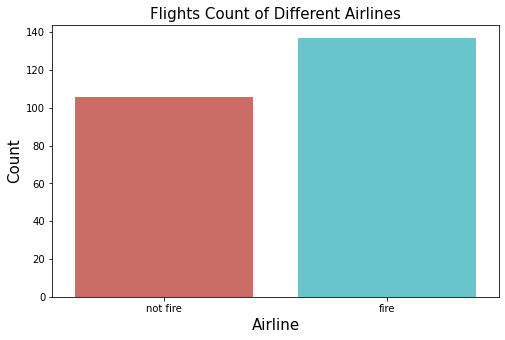

In [63]:
plt.figure(figsize=(8,5))
sns.countplot(df['Classes'],palette='hls')
plt.title('Flights Count of Different Airlines',fontsize=15)
plt.xlabel('Airline',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.show()

The dependent variable shows good balance data

In [65]:
# Numeric features in dataframe
numeric_features = [column for column in df.columns if df[column].dtype in ["int32", "float64"]]

In [66]:
numeric_features

['day',
 'month',
 'Temperature',
 'RH',
 'Ws',
 'Rain',
 'FFMC',
 'DMC',
 'DC',
 'ISI',
 'BUI',
 'FWI',
 'Region']

In [70]:
df[numeric_features].head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Region
0,1,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,0
1,2,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,0
2,3,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,0
3,4,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,0
4,5,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,0


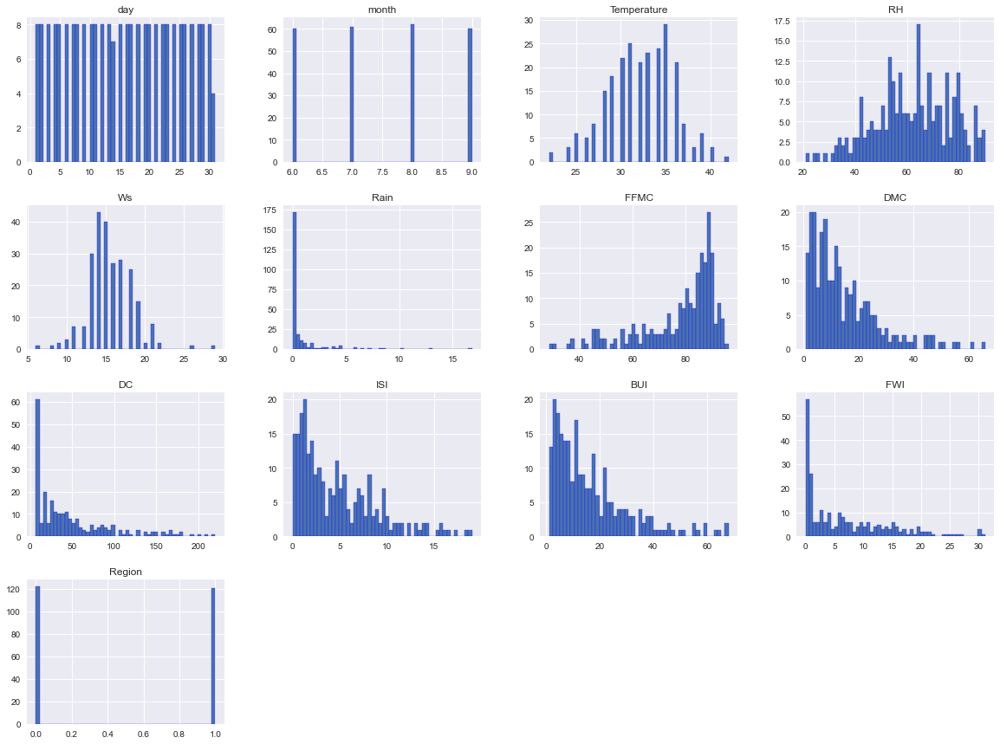

In [78]:
# PLot density plot for all features
plt.style.use('seaborn')
df.hist(bins=50, figsize=(20,15), ec = 'b')
plt.show()

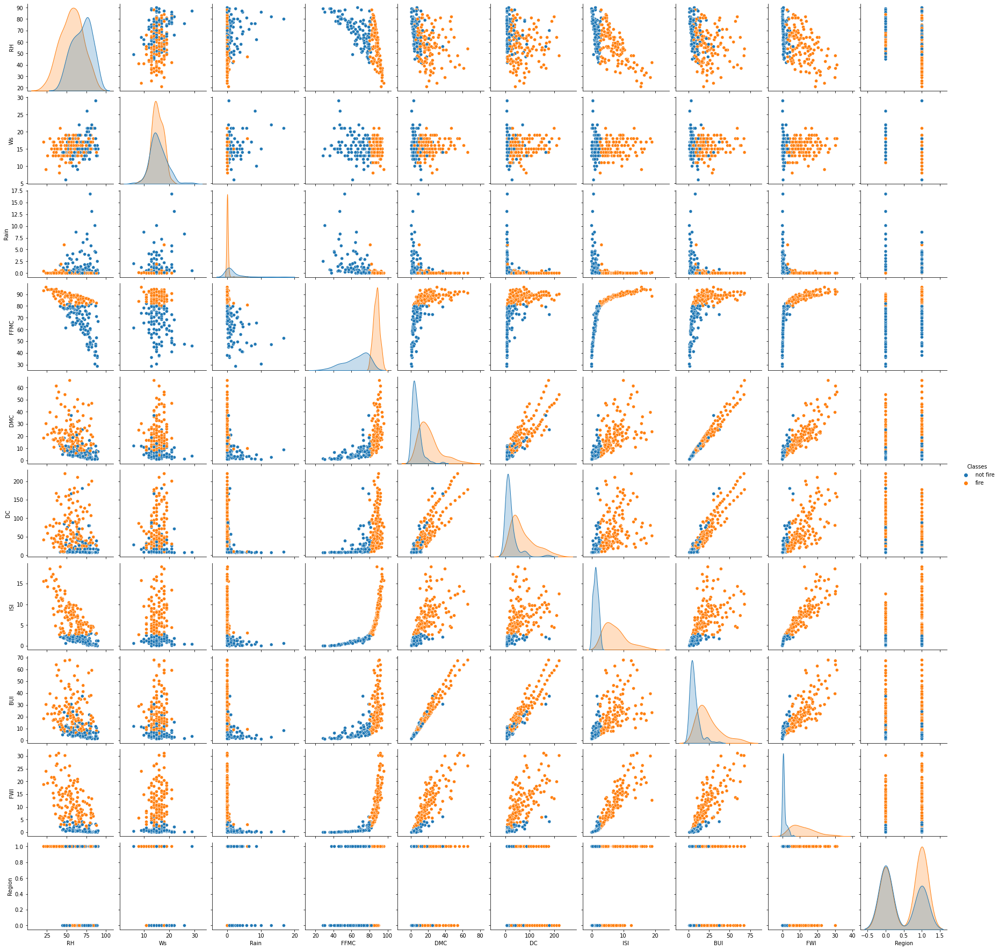

In [75]:
sns.pairplot(df.drop(columns=['day','month','Temperature']),hue='Classes')

* From above pairlot we can see that some features here following linear relationship

### Multicollinearity

<AxesSubplot:title={'center':'Correlation between Features'}>

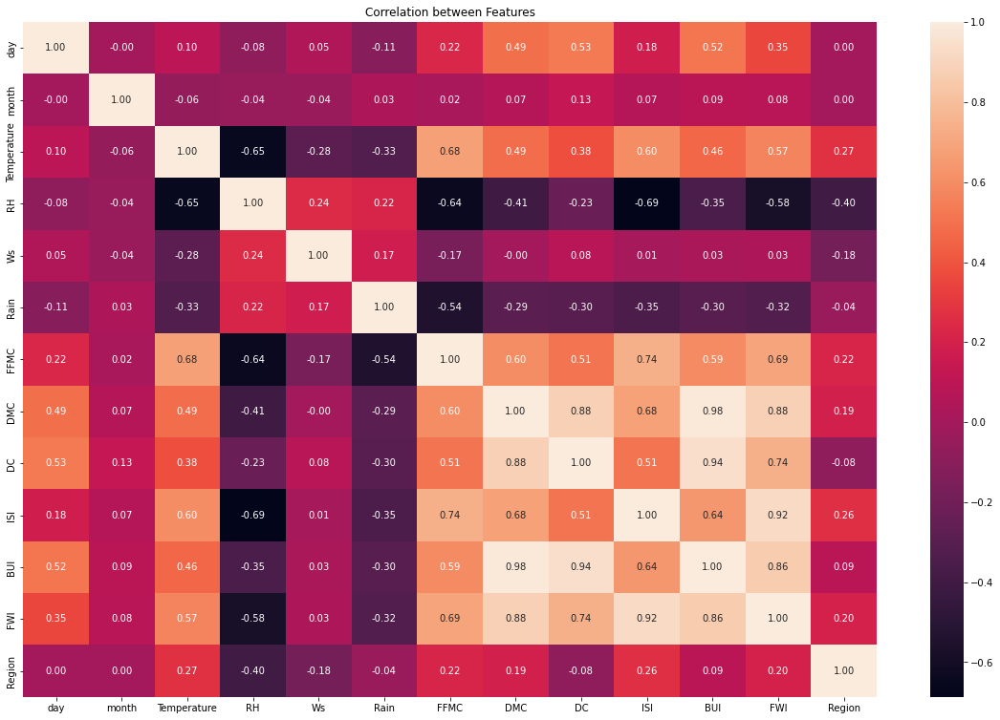

In [77]:
plt.figure(figsize=(20, 13))
plt.title("Correlation between Features")
sns.heatmap(df.corr(), annot=True,fmt='.2f')

In [ ]:
### Rain look like very less correlated to all the features also It has many outlires
* DC, DMC and BUI are very highly positive correlated to each other

#### Outlires detection

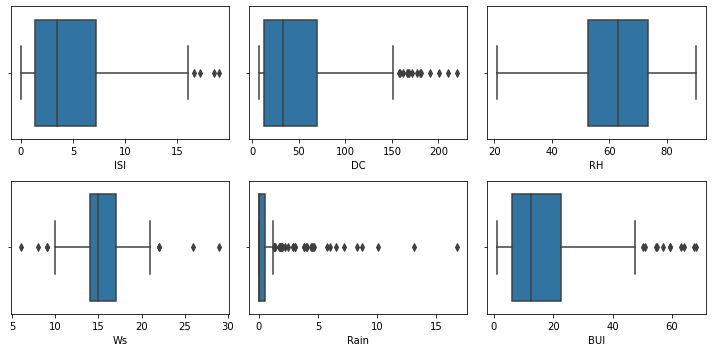

In [123]:
plt.figure(figsize=(10,5))

plt.subplot(2,3,1)
outl_dect = sns.boxplot(df['ISI'])

plt.subplot(2,3,2)
outl_dect = sns.boxplot(df['DC'])

plt.subplot(2,3,3)
outl_dect = sns.boxplot(df['RH'])

plt.subplot(2,3,4)
outl_dect = sns.boxplot(df['Ws'])

plt.subplot(2,3,5)
outl_dect = sns.boxplot(df['Rain'])

plt.subplot(2,3,6)
outl_dect = sns.boxplot(df['BUI'])


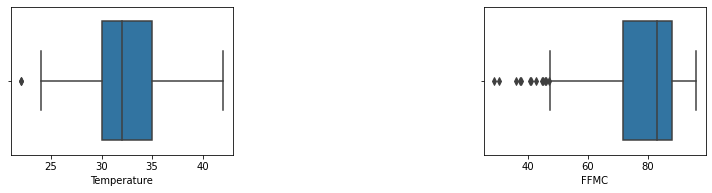

In [124]:
plt.figure(figsize=(10,5))

plt.subplot(2,3,1)
outl_dect = sns.boxplot(df['Temperature'])

plt.subplot(2,3,3)
outl_dect = sns.boxplot(df['FFMC'])

* Here are ore outlires in every feature except RH and temperature.Since we have less data, we dont want to remove them otherwise we will loose more data.
* Dependent variable for regression model i.e. Temperature dont have as such outlires, so we should not touch it.

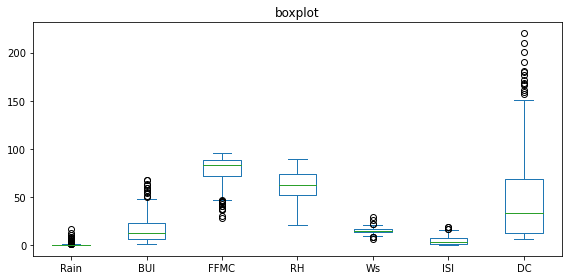

In [125]:
# Set the figure size
plt.rcParams["figure.figsize"] = [8, 4]
plt.rcParams["figure.autolayout"] = True

# Plot the dataframe
ax = df[['Rain', 'BUI','FFMC','RH','Ws','ISI','DC']].plot(kind='box', title='boxplot')

# Display the plot
plt.show()

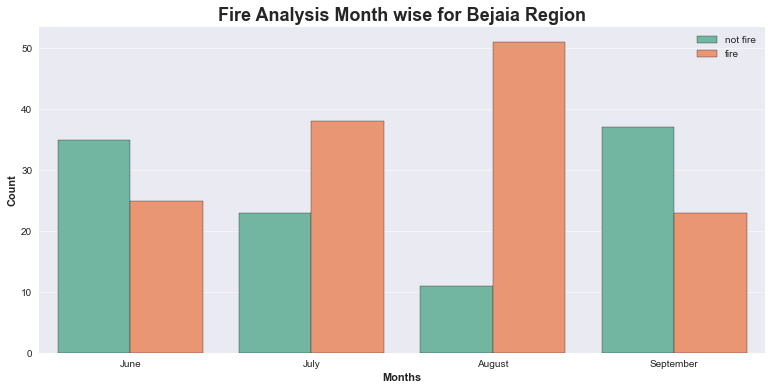

In [81]:
dftemp= df.loc[df['Region']== 1]
plt.subplots(figsize=(13,6))
sns.set_style('whitegrid')
sns.countplot(x='month',hue='Classes',data= df,ec = 'black', palette= 'Set2')
plt.title('Fire Analysis Month wise for Bejaia Region', fontsize=18, weight='bold')
plt.ylabel('Count', weight = 'bold')
plt.xlabel('Months', weight= 'bold')
plt.legend(loc='upper right')
plt.xticks(np.arange(4), ['June','July', 'August', 'September',])
plt.grid(alpha = 0.5,axis = 'y')
plt.show()

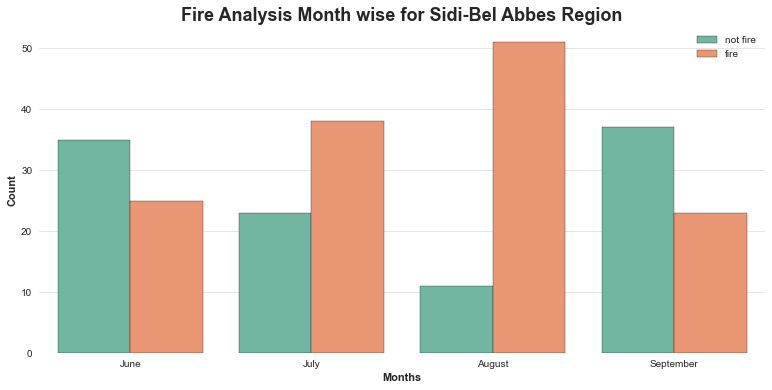

In [82]:
dftemp= df.loc[df['Region']== 2]
plt.subplots(figsize=(13,6))
sns.set_style('whitegrid')
sns.countplot(x='month',hue='Classes',data= df,ec = 'black', palette= 'Set2')
plt.title('Fire Analysis Month wise for Sidi-Bel Abbes Region', fontsize=18, weight='bold')
plt.ylabel('Count', weight = 'bold')
plt.xlabel('Months', weight= 'bold')
plt.legend(loc='upper right')
plt.xticks(np.arange(4), ['June','July', 'August', 'September',])
plt.grid(alpha = 0.5,axis = 'y')
plt.show()

Its observed that forest fire is on peak in August month for both regions. And other regions also have some forest fire but less than what happening in August month, So month can be a good variable in our model

# Data Transformation

In [89]:
df.head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
0,1,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,not fire,0
1,2,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,not fire,0
2,3,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire,0
3,4,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,not fire,0
4,5,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,not fire,0


##  Encoding

* We shall recategorize the categories of the variable Classes for easy and simple data.

In [90]:
df['Classes'].loc[df['Classes'].isin(['not fire'])] = 0
df['Classes'].loc[df['Classes'].isin(['fire'])] = 1

In [91]:
df.head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
0,1,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,0,0
1,2,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,0,0
2,3,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,0,0
3,4,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,0,0
4,5,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,0,0


### Different Types Of Data Distribution
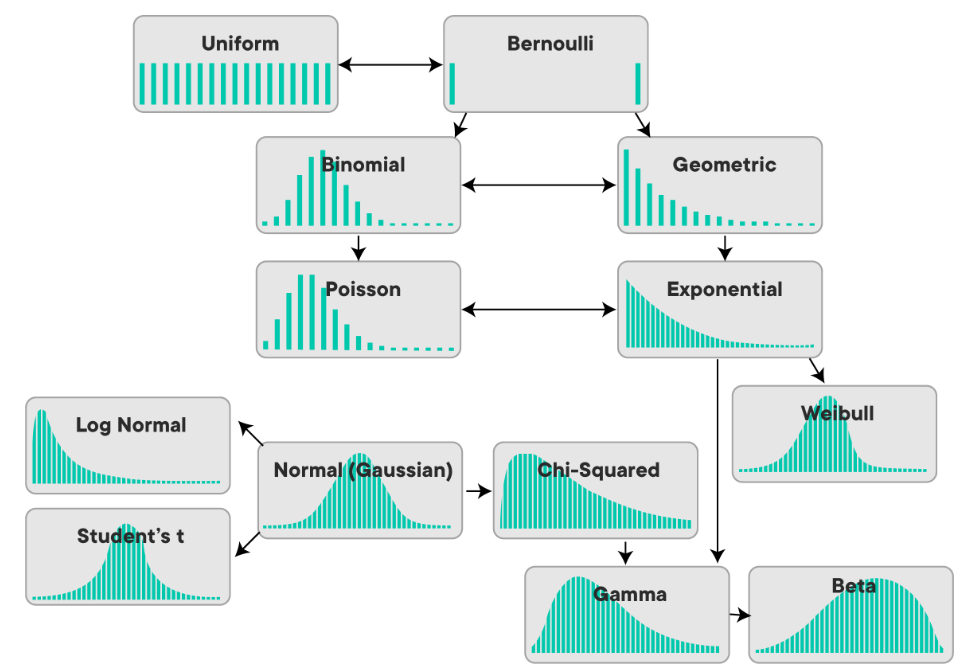

## Feature selection
* for Handeling Skewness of data
* For the features who has log normal distribution and higher skewness will be taken into log transformation action

<AxesSubplot:xlabel='ISI', ylabel='Density'>

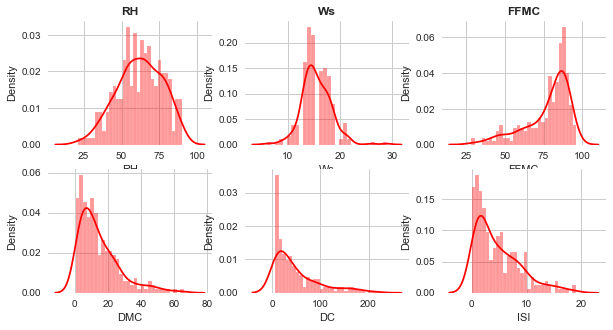

In [109]:
sns.set_style('whitegrid')

plt.figure(figsize=(10,5))

plt.subplot(2,3,1)
plt.title('BUI', fontsize=12, weight='bold')
sns.distplot(df['BUI'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,2)
plt.title('Ws', fontsize=12, weight='bold')
sns.distplot(df['Ws'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,3)
plt.title('FFMC', fontsize=12, weight='bold')
sns.distplot(df['FFMC'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,4)
sns.distplot(df['DMC'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,5)
sns.distplot(df['DC'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,6)
sns.distplot(df['ISI'], kde = True, color ='red', bins = 30)

<AxesSubplot:title={'center':'BUI'}, xlabel='BUI', ylabel='Density'>

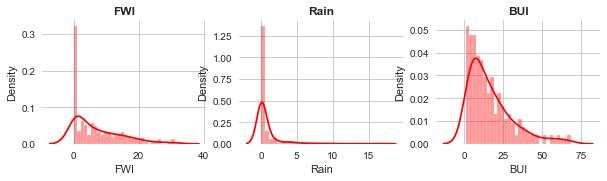

In [119]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))

plt.subplot(2,3,1)
plt.title('FWI', fontsize=12, weight='bold')
sns.distplot(df['FWI'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,2)
plt.title('Rain', fontsize=12, weight='bold')
sns.distplot(df['Rain'], kde = True, color ='red', bins = 30)

plt.subplot(2,3,3)
plt.title('BUI', fontsize=12, weight='bold')
sns.distplot(df['BUI'], kde = True, color ='red', bins = 30)

* O1 :From above density ditribution plot we can say that DMC,FFMC, DC,BUI, Rain showing log normal distribution with highly sknewness
* O2: From above density ditribution plot we can say that RH,Ws showing approximatly normal distribution
* O3: ISI and Rain has very less variance so we will not apply any transformation.

## Analysing log Normal transformation

In [112]:
def plot(df,var,t):
    plt.figure(figsize=(13,5))
    plt.subplot(121)
    sns.distplot(df[var])
    plt.title('before'+str(t))
    plt.subplot(122)
    sns.distplot(t)
    plt.title('After'+str(t))

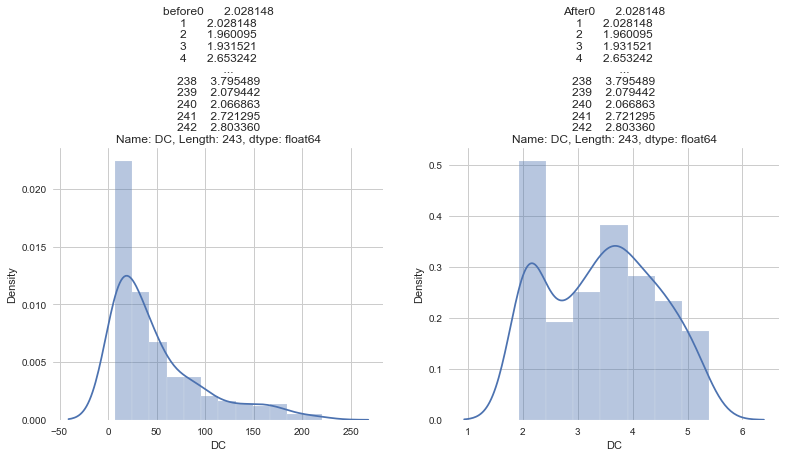

In [114]:
plot(df,'DC',np.log(df['DC']))

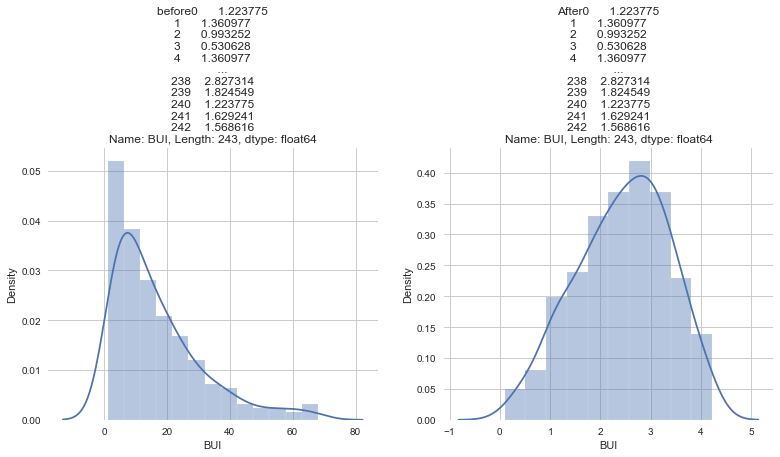

In [120]:
plot(df,'BUI',np.log(df['BUI']))

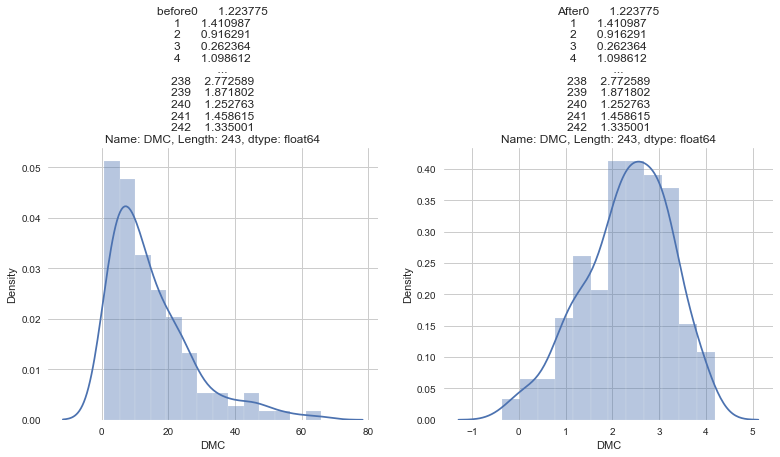

In [124]:
plot(df,'DMC',np.log(df['DMC']))

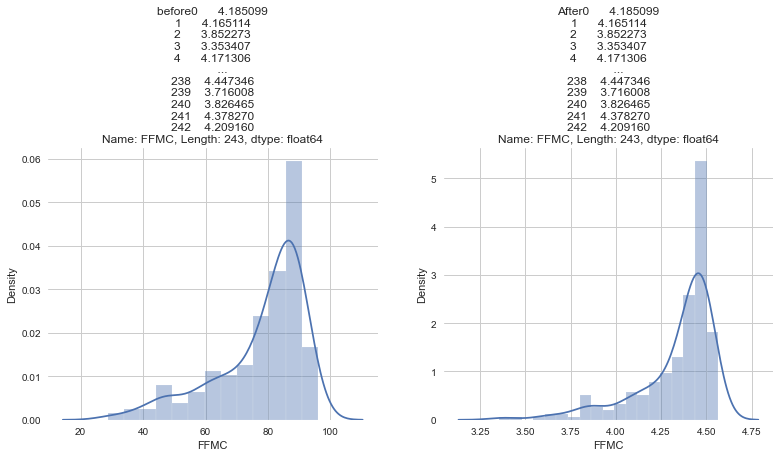

In [125]:
plot(df,'FFMC',np.log(df['FFMC']))

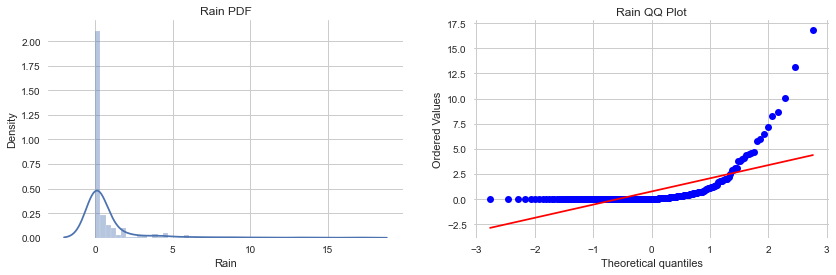

In [130]:
plt.figure(figsize=(14,4))
plt.subplot(121)
sns.distplot(df['Rain'])
plt.title('Rain PDF')
    
plt.subplot(122)
stats.probplot(df['Rain'], dist = "norm", plot=plt)
plt.title('Rain QQ Plot')

plt.show()

* For left skewed FFMC log transformation is not look like good.
* While for positive skewed log transformation is performing well.
* From above observation log transformation for log normal distribution for positive highly sknewness feature performing well.

Box-Cox requires input data to be strictly positive, while Yeo-Johnson supports both positive or negative data, So we will apply Yeo-Johnson

## Analysing Sqrt transformation

In [142]:
df.head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
0,1,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,0,0
1,2,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,0,0
2,3,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,0,0
3,4,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,0,0
4,5,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,0,0


In [ ]:
from scipy.stats import skew

day
0.0003623443332990968


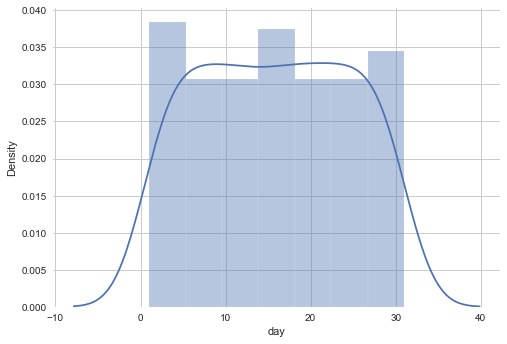

month
-0.005175039873460399


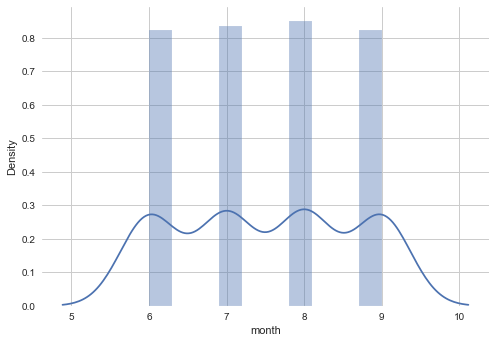

RH
-0.24128917184935364


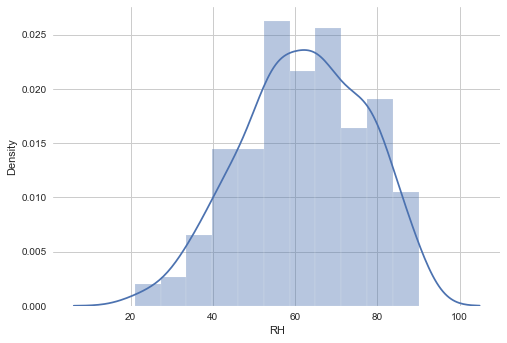

Ws
0.5521504046713673


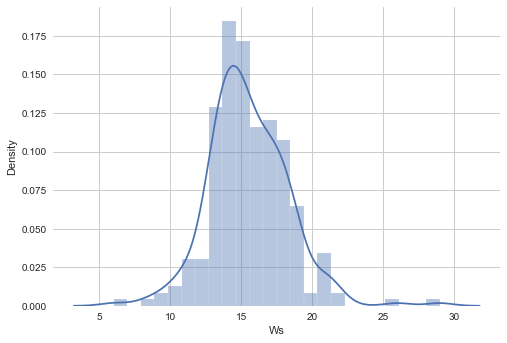

Rain
4.540379891073477


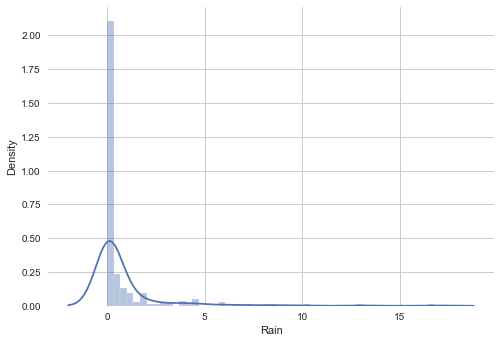

FFMC
-1.3119671515422793


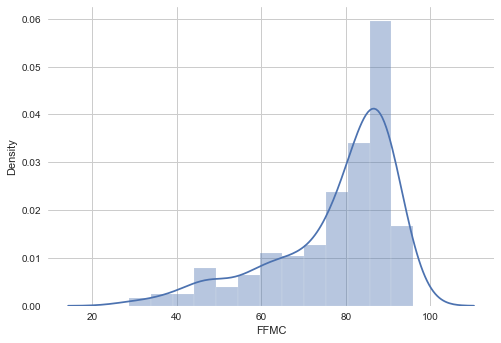

DMC
1.5135656357590381


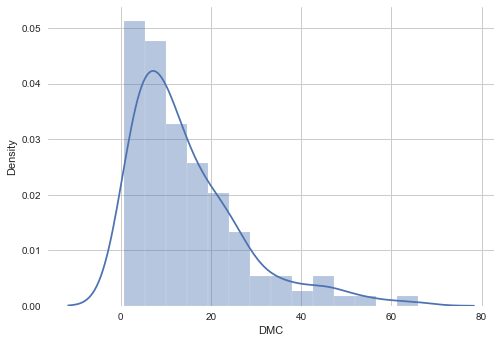

DC
1.4643491548601568


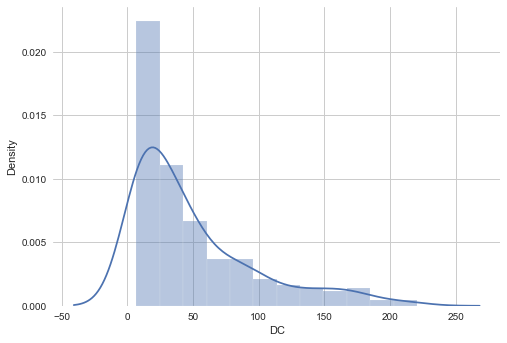

ISI
1.1331919265190582


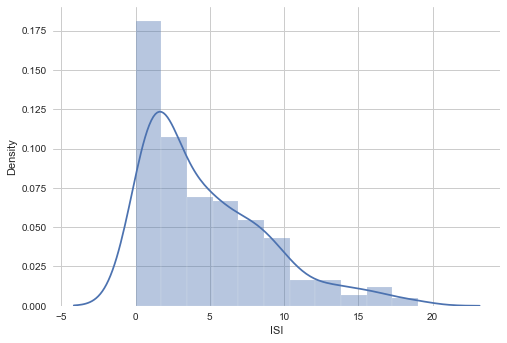

BUI
1.4437618594670727


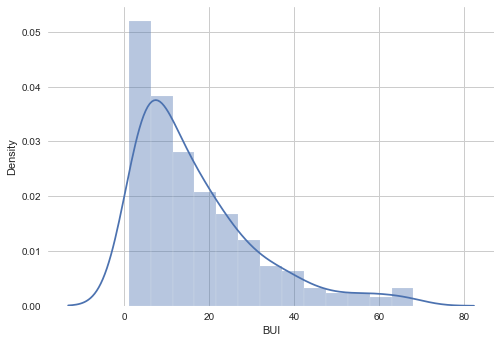

FWI
1.1404964247577793


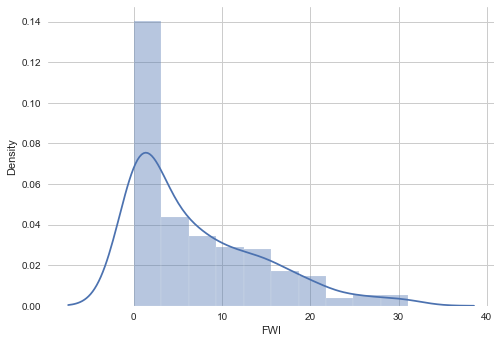

In [151]:
for col in x:
    print(col)
    print(skew(x[col]))
    
    plt.figure()
    sns.distplot(x[col])
    plt.show()

A skewness value greater than 1 or less than -1 indicates a highly skewed distribution. A value between 0.5 and 1 or -0.5 and -1 is moderately skewed. A value between -0.5 and 0.5 indicates that the distribution is fairly symmetrical.

Here RH,Ws has very less skewness  while Rain,FFMC,DMC,DC,ISI,BUI, and FWI have high skewness

<AxesSubplot:title={'center':'Correlation between Features'}>

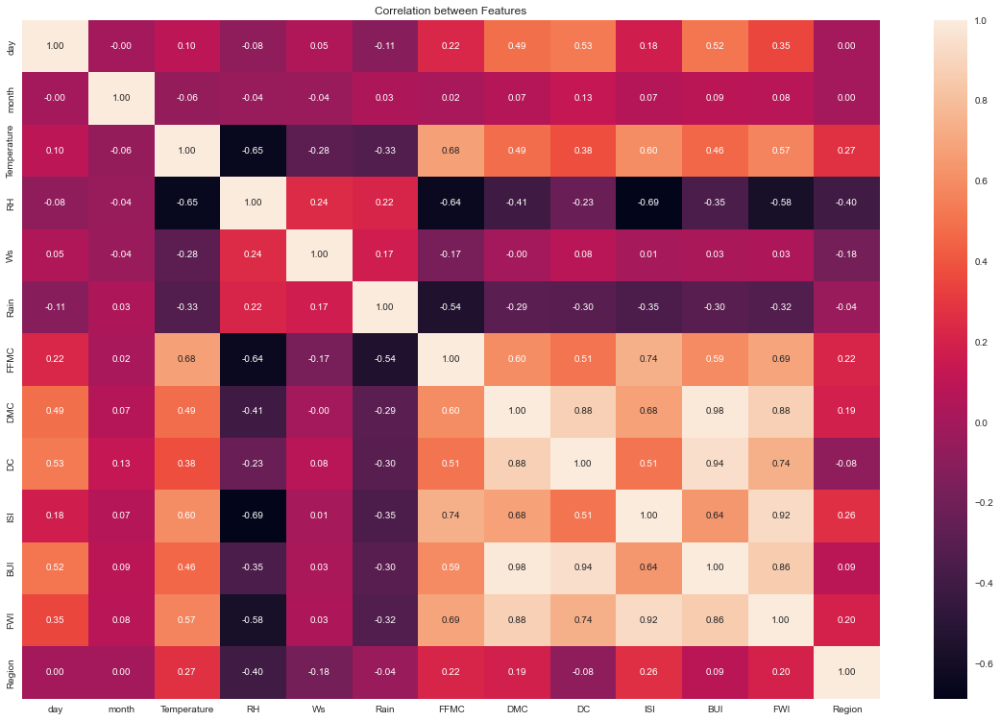

In [152]:
plt.figure(figsize=(20, 13))
plt.title("Correlation between Features")
sns.heatmap(df.corr(), annot=True,fmt='.2f')

* We need to keep in mind that the transormation like lig, power, square root or cube root change the correlation with transformation
* So reduce or remove skewness of those column which have less correlation with target feature. Because we cant take good correlated feature into harm of lossing good correlation

In [ ]:
From correlation BUI,DMC,DC are less correlated with target feature so we will apply transformation on these column 

In [143]:
x = df.drop(columns=['Temperature','Classes','Region'],axis=1)

In [144]:
x.columns

Index(['day', 'month', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC', 'ISI', 'BUI',
       'FWI'],
      dtype='object')

day
0      1.000000
1      1.414214
2      1.732051
3      2.000000
4      2.236068
         ...   
238    5.099020
239    5.196152
240    5.291503
241    5.385165
242    5.477226
Name: day, Length: 243, dtype: float64


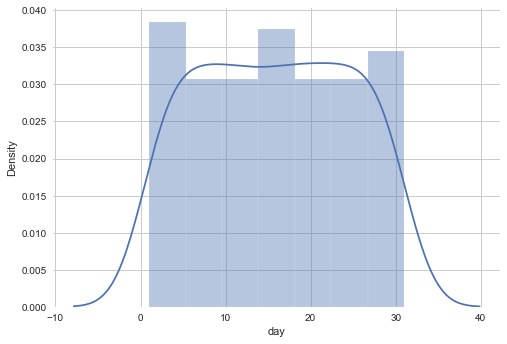

month
0      2.44949
1      2.44949
2      2.44949
3      2.44949
4      2.44949
        ...   
238    3.00000
239    3.00000
240    3.00000
241    3.00000
242    3.00000
Name: month, Length: 243, dtype: float64


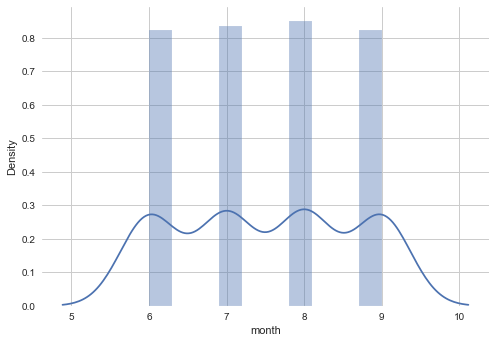

RH
0      7.549834
1      7.810250
2      9.055385
3      9.433981
4      8.774964
         ...   
238    8.062258
239    9.327379
240    9.327379
241    7.348469
242    8.000000
Name: RH, Length: 243, dtype: float64


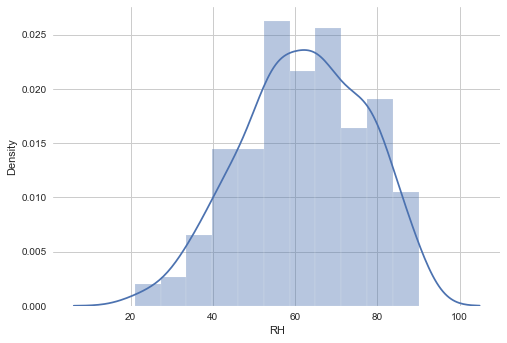

Ws
0      4.242641
1      3.605551
2      4.690416
3      3.605551
4      4.000000
         ...   
238    3.741657
239    3.872983
240    5.385165
241    4.242641
242    3.872983
Name: Ws, Length: 243, dtype: float64


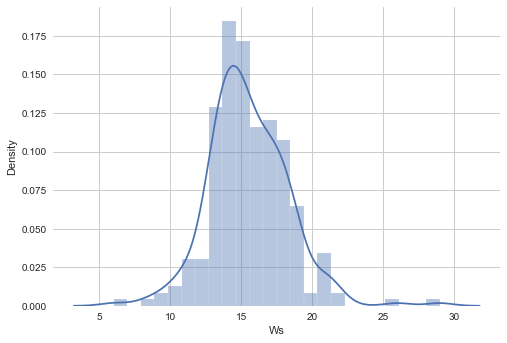

Rain
0      0.000000
1      1.140175
2      3.619392
3      1.581139
4      0.000000
         ...   
238    0.000000
239    2.097618
240    0.707107
241    0.316228
242    0.447214
Name: Rain, Length: 243, dtype: float64


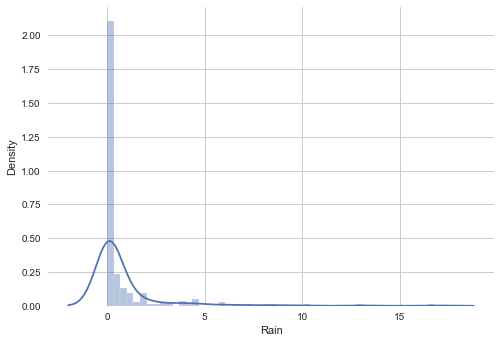

FFMC
0      8.105554
1      8.024961
2      6.862944
3      5.347897
4      8.049845
         ...   
238    9.241212
239    6.410928
240    6.774954
241    8.927486
242    8.203658
Name: FFMC, Length: 243, dtype: float64


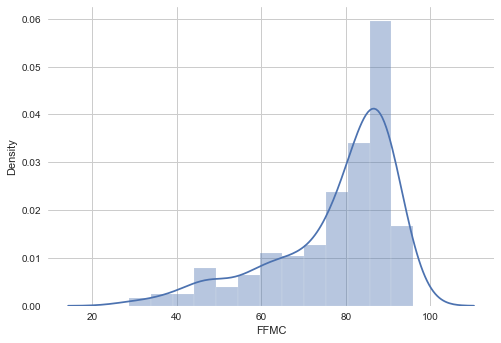

DMC
0      1.843909
1      2.024846
2      1.581139
3      1.140175
4      1.732051
         ...   
238    4.000000
239    2.549510
240    1.870829
241    2.073644
242    1.949359
Name: DMC, Length: 243, dtype: float64


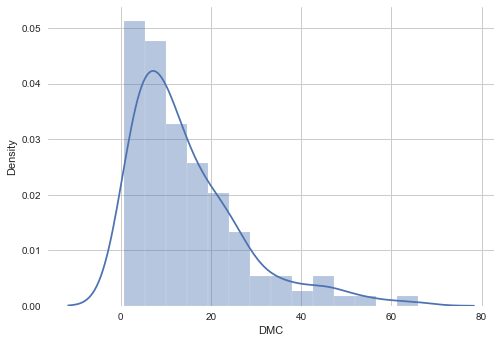

DC
0      2.756810
1      2.756810
2      2.664583
3      2.626785
4      3.768289
         ...   
238    6.670832
239    2.828427
240    2.810694
241    3.898718
242    4.062019
Name: DC, Length: 243, dtype: float64


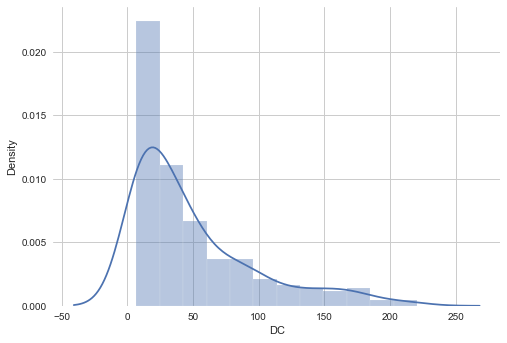

ISI
0      1.140175
1      1.000000
2      0.547723
3      0.000000
4      1.095445
         ...   
238    2.121320
239    0.316228
240    0.632456
241    1.303840
242    1.095445
Name: ISI, Length: 243, dtype: float64


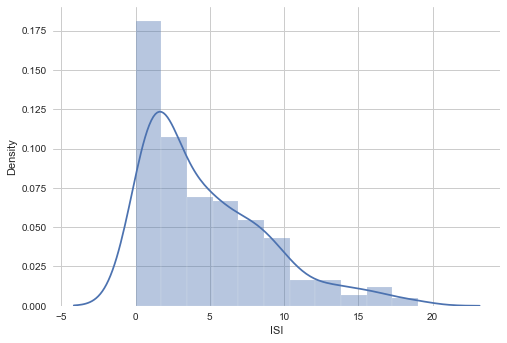

BUI
0      1.843909
1      1.974842
2      1.643168
3      1.303840
4      1.974842
         ...   
238    4.110961
239    2.489980
240    1.843909
241    2.258318
242    2.190890
Name: BUI, Length: 243, dtype: float64


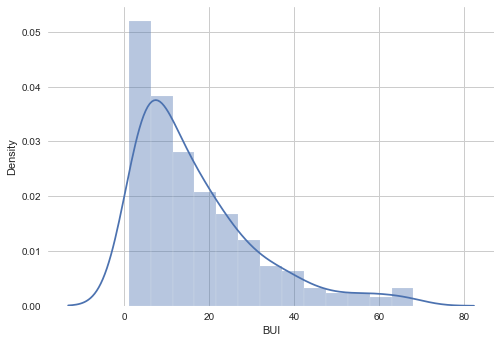

FWI
0      0.707107
1      0.632456
2      0.316228
3      0.000000
4      0.707107
         ...   
238    2.549510
239    0.000000
240    0.447214
241    0.836660
242    0.707107
Name: FWI, Length: 243, dtype: float64


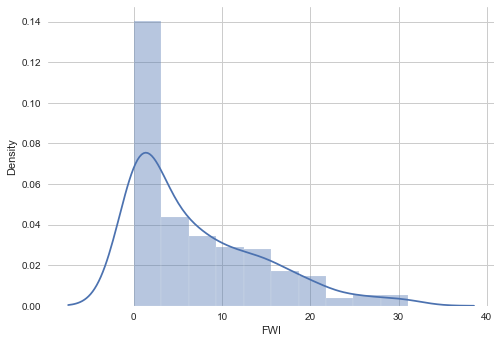

In [159]:
for col in x:
    print(col)
    print(np.sqrt(x[col]))
    
    plt.figure()
    sns.distplot(x[col])
    plt.show()

In [161]:
df1=df.copy()

In [164]:
df1["DC"]=np.sqrt(df1["DC"])

In [165]:
skew(df1["DC"])

0.746020195696792

In [166]:
df1["FFMC"]=np.sqrt(df1["FFMC"])

In [167]:
skew(df1["FFMC"])

-1.5491166115542474

In [ ]:
df1["FFMC"]=np.cbrt(df1["FFMC"])

Here we can see that sqrt transformation is well performing for right skew feature while badly transform for  left skewed feature

## Analysing Feature scaling

In [172]:
def scaler_standard(df):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(df)
    
    return X_train_scaled


In [173]:
X_train_scaled= scaler_standard(df)

Text(0.5, 1.0, 'X_train After Scaling')

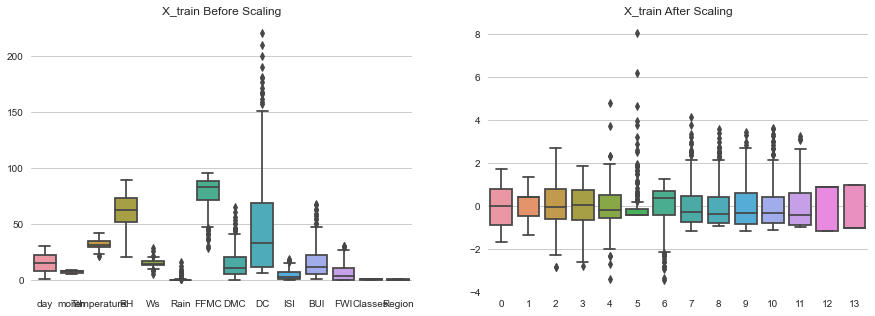

In [174]:
plt.subplots(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.boxplot(data=df)
plt.title('X_train Before Scaling')
plt.subplot(1, 2, 2)
sns.boxplot(data=X_train_scaled)
plt.title('X_train After Scaling')

# Report On EDA and Feature engineering

1. Data has records from two region Bejaia and Sidi Bel-abbes
2. There  are two misssing value in each feature except Classes feature have two Nan values
##### Outlires: 
1. Here are ore outlires in every feature except RH and temperature.Since we have less data, we dont want to remove them otherwise we will loose more data.
2. Dependent variable for regression model i.e. Temperature dont have as such outlires, so we should not touch it.

##### Correlation: 
1. From correlation BUI(0.46),DMC(0.49),DC(0.38) are less correlated with target feature so we will take action on these column
2. Also DC, DMC and BUI are very highly positive correlated(>0.90) to each other
*  As DC is less correlated with target variable(Means less valuable for prediction) and DC highly correleted with DMC and BUI (Alternative features inplace DC) so we can drop it

<AxesSubplot:title={'center':'Correlation between Features'}>

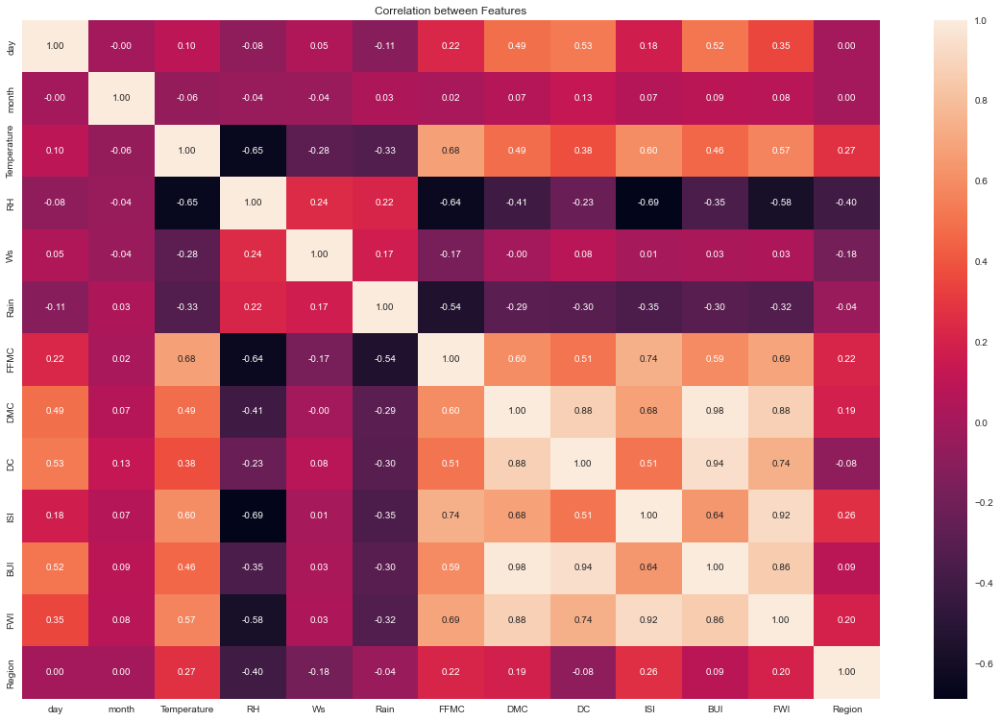

In [175]:
plt.figure(figsize=(20, 13))
plt.title("Correlation between Features")
sns.heatmap(df.corr(), annot=True,fmt='.2f')

### Target = Classes

In [133]:
pd.crosstab(df['DC'], columns = 'Normalized', normalize = True)

col_0,Normalized
DC,
6.9,0.004115
7.0,0.008230
7.1,0.004115
7.3,0.008230
7.4,0.008230
...,...
181.3,0.004115
190.6,0.004115
200.2,0.004115


In [134]:
df.drop(['FWI','DMC'],axis=1,inplace=True)

In [135]:
df.head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DC,ISI,BUI,Classes,Region
0,1,6,29,57,18,0.0,65.7,7.6,1.3,3.4,0,0
1,2,6,29,61,13,1.3,64.4,7.6,1.0,3.9,0,0
2,3,6,26,82,22,13.1,47.1,7.1,0.3,2.7,0,0
3,4,6,25,89,13,2.5,28.6,6.9,0.0,1.7,0,0
4,5,6,27,77,16,0.0,64.8,14.2,1.2,3.9,0,0


In [136]:
#Finding the Boundary Values
print("Highest allowed",df['DC'].mean() + 3*df['DC'].std())
print("Lowest allowed",df['DC'].mean() - 3*df['DC'].std())

Highest allowed 192.42768215130064
Lowest allowed -93.5659537562389


In [137]:
#Capping on Outliers with upper_limit and lower_limit
upper_limit = df['DC'].mean() + 3*df['DC'].std()
lower_limit = df['DC'].mean() - 3*df['DC'].std()

In [138]:
df['DC'] = np.where(
    df['DC']>upper_limit,
    upper_limit,
    np.where(
        df['DC']<lower_limit,
        lower_limit,
        df['DC']
    )
)

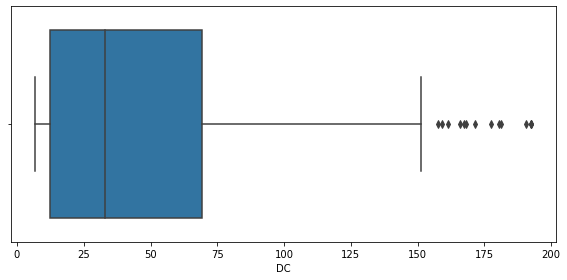

In [139]:
outl_dect = sns.boxplot(df['DC'])

In [140]:
#Finding the Boundary Values
print("Highest allowed",df['FFMC'].mean() + 3*df['FFMC'].std())
print("Lowest allowed",df['FFMC'].mean() - 3*df['FFMC'].std())

Highest allowed 120.89131060146605
Lowest allowed 34.79346306108542


In [141]:
#Capping on Outliers with upper_limit and lower_limit
upper_limit = df['FFMC'].mean() + 3*df['FFMC'].std()
lower_limit = df['FFMC'].mean() - 3*df['FFMC'].std()

In [142]:
df['FFMC'] = np.where(
    df['FFMC']>upper_limit,
    upper_limit,
    np.where(
        df['FFMC']<lower_limit,
        lower_limit,
        df['FFMC']
    )
)

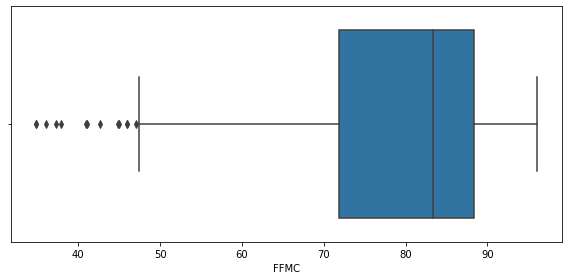

In [143]:
outl_dect = sns.boxplot(df['FFMC'])

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243 entries, 0 to 243
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          243 non-null    int32  
 1   month        243 non-null    int32  
 2   Temperature  243 non-null    int32  
 3   RH           243 non-null    int32  
 4   Ws           243 non-null    int32  
 5   Rain         243 non-null    float64
 6   FFMC         243 non-null    float64
 7   DC           243 non-null    float64
 8   ISI          243 non-null    float64
 9   BUI          243 non-null    float64
 10  Classes      243 non-null    object 
 11  Region       243 non-null    int32  
dtypes: float64(5), int32(6), object(1)
memory usage: 19.0+ KB


In [145]:
df[['Classes']]=df[['Classes']].astype(int)

In [146]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243 entries, 0 to 243
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   day          243 non-null    int32  
 1   month        243 non-null    int32  
 2   Temperature  243 non-null    int32  
 3   RH           243 non-null    int32  
 4   Ws           243 non-null    int32  
 5   Rain         243 non-null    float64
 6   FFMC         243 non-null    float64
 7   DC           243 non-null    float64
 8   ISI          243 non-null    float64
 9   BUI          243 non-null    float64
 10  Classes      243 non-null    int32  
 11  Region       243 non-null    int32  
dtypes: float64(5), int32(7)
memory usage: 18.0 KB


In [147]:
X = df.drop(['Classes'], axis = 1)
y = df['Classes']

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100) 

print('Train Shape: ', X_train.shape)
print('Test Shape: ', X_test.shape)

Train Shape:  (170, 11)
Test Shape:  (73, 11)


In [155]:
"""Now initialize all the classifiers object."""
"""#1.Logistic Regression"""
lr = LogisticRegression(solver='liblinear')

"""#2.Support Vector Machines"""
svc = SVC(gamma = "auto")

"""#3.Random Forest Classifier"""
rf = RandomForestClassifier(n_estimators = 50, random_state = 11850) 

"""#4.KNN"""
knn = KNeighborsClassifier()

"""#5.Gaussian Naive Bayes"""
gnb = GaussianNB()

"""#6.Decision Tree Classifier"""
dt = DecisionTreeClassifier(random_state = 11850)


In [156]:
"""List of all the models with their indices."""
modelNames = ["LR", "SVC", "RF", "KNN", "GNB", "DT"]
models = ["lr", "svc", "rf", "knn", "gnb", "dt"]

In [157]:
"""Create a function that returns train accuracy of different models."""
def calculateTrainAccuracy(model):
    """Returns training accuracy of a model."""
    
    model.fit(X_train, y_train)
    trainAccuracy = model.score(X_train, y_train)
    trainAccuracy = round(trainAccuracy*100, 2)
    return trainAccuracy

# Calculate train accuracy of all the models and store them in a dataframe
modelScores = list(map(calculateTrainAccuracy, models))
trainAccuracy = pd.DataFrame(modelScores, columns = ["trainAccuracy"], index=modelNames)
trainAccuracySorted = trainAccuracy.sort_values(by="trainAccuracy", ascending=False)
bold("Training Accuracy of the Classifiers:")
display(trainAccuracySorted)

AttributeError: 'str' object has no attribute 'fit'

### Random Forest

In [98]:
# Model 1 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import accuracy_score  
# Create and fit model 
rf = RandomForestClassifier(n_estimators = 50, random_state = 11850) 
rf = rf.fit(X_train, y_train)  

In [99]:
preds = rf.predict(X_test)  # Get predictions  
testAccuracy = round(accuracy_score(y_true = y_test, y_pred = preds))
testAccuracy

1

In [101]:
trainAccuracy = round(rf.score(X_train, y_train))
trainAccuracy

1

### Logistic Regression

In [177]:
log_regressor=LogisticRegression()
parameters={'C':[1e-15,1e-10,1e-8,1e-3,1e-2,0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ],'penalty':['l1','l2','elasticnet']}
logi_regressor=GridSearchCV(log_regressor,parameters,scoring='accuracy',cv=5)
logi_regressor.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 0.0001, 0.001,
                               0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                               0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0,
                               9.0, 10.0, 20, 50, ...],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='accuracy')

In [178]:
trainAccuracy = (logi_regressor.best_score_)
trainAccuracy

0.9823529411764707

In [179]:
preds = logi_regressor.predict(X_test)  # Get predictions  
testAccuracy = round(accuracy_score(y_true = y_test, y_pred = preds))
testAccuracy

1

### SVM

In [180]:
classifier=SVC(kernel="rbf")
classifier.fit(X_train,y_train)

SVC()

In [182]:
from sklearn.metrics import accuracy_score
y_pred = classifier.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9041095890410958

In [184]:
trainAccuracy = round(classifier.score(X_train, y_train))
trainAccuracy

1

In [185]:
classifier=SVC(kernel="poly")
classifier.fit(X_train,y_train)

SVC(kernel='poly')

In [186]:
from sklearn.metrics import accuracy_score
y_pred = classifier.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9452054794520548

In [187]:
trainAccuracy = round(classifier.score(X_train, y_train))
trainAccuracy

1

In [268]:
parameters={'C':[1e-15,1e-10,1e-8,1e-3,1e-2,0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ], "gamma": [0.5, 0.2, 0.1, 0.001, 0.0001]}
classifier=SVC(kernel="poly")
SVC_classifier=GridSearchCV(classifier,parameters,scoring='accuracy',cv=5)
SVC_classifier.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=SVC(kernel='poly'),
             param_grid={'C': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 0.0001, 0.001,
                               0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7,
                               0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0,
                               9.0, 10.0, 20, 50, ...],
                         'gamma': [0.5, 0.2, 0.1, 0.001, 0.0001]},
             scoring='accuracy')

In [269]:
from sklearn.metrics import accuracy_score
y_pred = SVC_classifier.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9452054794520548

### KNN

In [208]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [209]:
trainAccuracy = round(knn.score(X_train, y_train))
trainAccuracy

1

In [210]:
from sklearn.metrics import accuracy_score
y_pred = knn.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9041095890410958

In [213]:
# error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

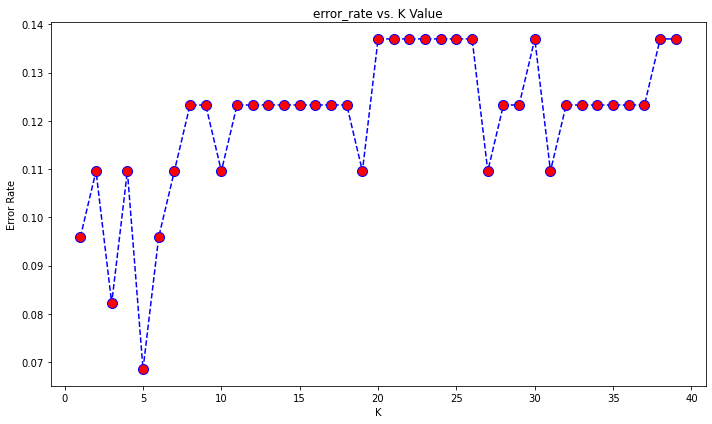

In [214]:
plt.figure(figsize=(10,6))
#plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
  #       markerfacecolor='red', markersize=10)
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('error_rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [221]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [222]:
trainAccuracy = round(knn.score(X_train, y_train))
trainAccuracy

1

In [223]:
from sklearn.metrics import accuracy_score
y_pred = knn.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9315068493150684

In [261]:
knnParams = { "leaf_size":[1, 2, 3, 5],
              "weights":["uniform", "distance"],
              "algorithm":["auto", "ball_tree","kd_tree","brute"]}


In [262]:
gridSearch = GridSearchCV(knn, knnParams, verbose=0, cv=10, scoring="accuracy", n_jobs = -1)


In [263]:
knn = KNeighborsClassifier()
knn_classifier=GridSearchCV(knn,knnParams,scoring='accuracy',cv=5)
knn_classifier.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [1, 2, 3, 5],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [264]:
from sklearn.metrics import accuracy_score
y_pred = knn_classifier.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9315068493150684

### Decision Tree

In [106]:
DC=DecisionTreeClassifier(random_state=0)
DC.fit(X_train,y_train)

DecisionTreeClassifier(random_state=0)

In [107]:
trainAccuracy = round(knn.score(X_train, y_train))
trainAccuracy

NotFittedError: This KNeighborsClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [227]:
y_pred = DC.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9726027397260274

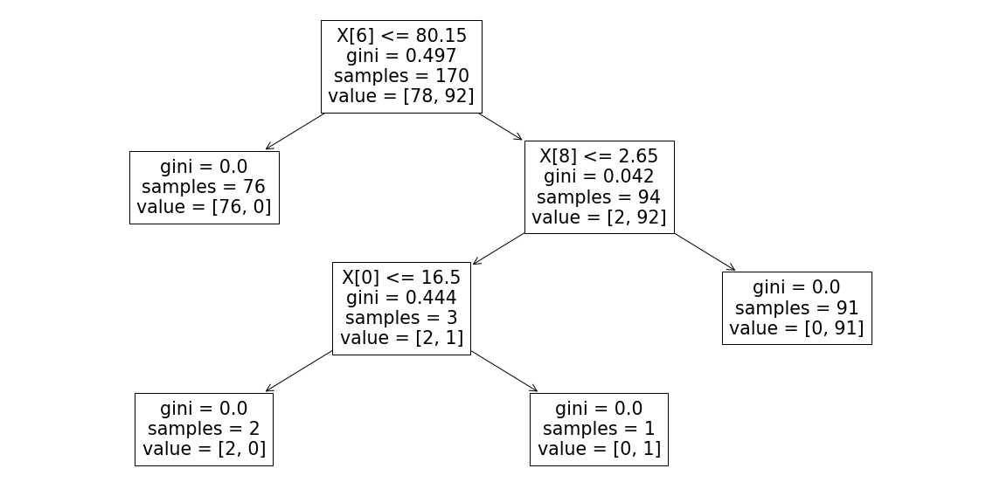

In [229]:
from sklearn import tree
plt.figure(figsize=(16,8))
tree.plot_tree(DC)
plt.show()

In [232]:
path=DC.cost_complexity_pruning_path(X_train,y_train)
#path variable gives two things ccp_alphas and impurities
ccp_alphas,impurities=path.ccp_alphas,path.impurities
print("List of ccp alpha values :",ccp_alphas)
print("***********************************************************")
print("Impurities in Decision Tree :",impurities)

List of ccp alpha values : [0.         0.00784314 0.01518565 0.47358021]
***********************************************************
Impurities in Decision Tree : [0.         0.00784314 0.02302879 0.496609  ]


In [234]:
DCs=[]   #will store all the models here
for ccp_alpha in ccp_alphas:
    clf=DecisionTreeClassifier(random_state=0,ccp_alpha=ccp_alpha)
    clf.fit(X_train,y_train)
    DCs.append(clf)
print("Last node in Decision tree is {} and ccp_alpha for last node is {}".format(DCs[-1].tree_.node_count,ccp_alphas[-1]))

Last node in Decision tree is 1 and ccp_alpha for last node is 0.4735802105573143


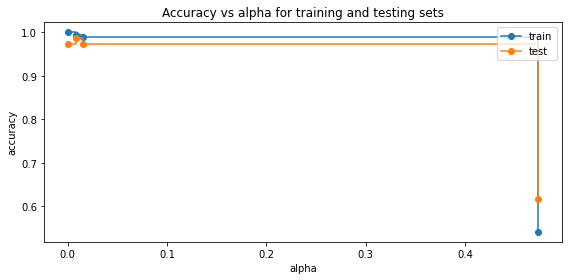

In [235]:
train_scores = [DC.score(X_train, y_train) for DC in DCs]
test_scores = [DC.score(X_test, y_test) for DC in DCs]
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",drawstyle="steps-post")
ax.legend()
plt.show()

In [249]:
DC=DecisionTreeClassifier(random_state=0,ccp_alpha=0.01)
DC.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.01, random_state=0)

In [253]:
trainAccuracy = round(DC.score(X_train, y_train))
trainAccuracy

1

In [254]:
y_pred = DC.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9863013698630136

### Gaussian Naive Bayes

In [255]:
gnb = GaussianNB()
gnb.fit(X_train,y_train)

GaussianNB()

In [256]:
trainAccuracy = round(gnb.score(X_train, y_train))
trainAccuracy

1

In [257]:
y_pred = gnb.predict(X_test)
testAccuracy = accuracy_score(y_test, y_pred)
testAccuracy

0.9315068493150684

In [86]:
import lazypredict
from lazypredict.Supervised import LazyClassifier

In [87]:
clf = LazyClassifier(verbose=0,ignore_warnings=True)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 35.51it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.99,0.98,0.98,0.99,0.07
QuadraticDiscriminantAnalysis,0.99,0.98,0.98,0.99,0.01
AdaBoostClassifier,0.97,0.97,0.97,0.97,0.16
ExtraTreesClassifier,0.97,0.97,0.97,0.97,0.09
DecisionTreeClassifier,0.97,0.96,0.96,0.97,0.01
Perceptron,0.96,0.96,0.96,0.96,0.01
RandomForestClassifier,0.96,0.96,0.96,0.96,0.13
ExtraTreeClassifier,0.96,0.96,0.96,0.96,0.01
SGDClassifier,0.96,0.95,0.95,0.96,0.01


In [88]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Pandas Profiling Report")
profile88

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

All Performance metrics https://scikit-learn.org/stable/modules/generated/sklearn.metrics.r2_score.html#sklearn.metrics.r2_score

In [90]:
### Finding R_square value for each model

In [134]:
from sklearn.metrics import r2_score
y_pred=rf.predict(X_test)
r2_score(y_test, y_pred)  #y_true, y_pred

0.942063492063492

In [ ]:
### MSE

In [155]:
def mean_squared_error(y_true, y_pred):       
    from sklearn.metrics import mean_squared_error
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)
    mse = mean_squared_error(prediction, y_test)
    return mse


In [156]:
'''Calculate train_test_split score of differnt models and plot them.'''
models = [rf,knn]
train_test_split_mse = []
for model in models:
    train_test_split_mse.append(train_test_split_score(model))

'''Plot data frame of train test rmse'''
train_test_score = pd.DataFrame(data = train_test_split_mse, columns = ['Train_Test_MSE'])
train_test_score.index = ['RF', 'KNN']
train_test_mse_score = train_test_score.round(5)
train_test_mse_score

,Train_Test_MSE
RF,0.01
KNN,0.07


In [111]:
### MSE

In [118]:
'''Evaluate models on the holdout set(say on 30%).'''
def train_test_split_score(model):
    from sklearn.metrics import mean_squared_error
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)
    mse = mean_squared_error(prediction, y_test)
    return mse

In [152]:
'''Calculate train_test_split score of differnt models and plot them.'''
models = [rf,knn]
train_test_split_mse = []
for model in models:
    train_test_split_mse.append(train_test_split_score(model))

'''Plot data frame of train test rmse'''
train_test_score = pd.DataFrame(data = train_test_split_mse, columns = ['Train_Test_MSE'])
train_test_score.index = ['RF', 'KNN']
train_test_mse_score = train_test_score.round(5)
train_test_mse_score

,Train_Test_MSE
RF,0.01
KNN,0.07


In [153]:
from sklearn.metrics import mean_squared_error
y_pred=knn.predict(X_test)
print(mean_squared_error(y_test,y_pred))

0.0684931506849315


### Target = Temperature

In [163]:
df.head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DC,ISI,BUI,Classes,Region
0,1,6,29,57,18,0.00,65.70,7.60,1.30,3.40,0,0
1,2,6,29,61,13,1.30,64.40,7.60,1.00,3.90,0,0
2,3,6,26,82,22,13.10,47.10,7.10,0.30,2.70,0,0
3,4,6,25,89,13,2.50,34.79,6.90,0.00,1.70,0,0
4,5,6,27,77,16,0.00,64.80,14.20,1.20,3.90,0,0


In [164]:
X = df.drop(['Temperature'], axis = 1)
y = df['Temperature']

In [165]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100) 

print('Train Shape: ', X_train.shape)
print('Test Shape: ', X_test.shape)

Train Shape:  (170, 11)
Test Shape:  (73, 11)


In [ ]:
# Model 1 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import accuracy_score  
# Create and fit model 
rf = RandomForestClassifier(n_estimators = 50, random_state = 11850) 
rf = rf.fit(X_train, y_train)  